In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import plotly_express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import PIL
import os

In [2]:
import tensorflow as tf
import tensorflow_datasets as tfds

In [3]:
tf.__version__

'2.4.1'

# Initial Data Checks

In [4]:
path = '/kaggle/input/cassava-leaf-disease-classification'

In [5]:
df = pd.read_csv(path+'/train.csv')
df.head()

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3


In [6]:
df.shape

(21397, 2)

In [7]:
vocab = pd.read_json(path+'/label_num_to_disease_map.json',typ='series')
vocab = list(vocab)
vocab

['Cassava Bacterial Blight (CBB)',
 'Cassava Brown Streak Disease (CBSD)',
 'Cassava Green Mottle (CGM)',
 'Cassava Mosaic Disease (CMD)',
 'Healthy']

In [8]:
df['image_id'] = df['image_id'].apply(lambda x : path+'/train_images/'+x)
df['label'] = df['label'].apply(lambda x : vocab[x])
df.head()

,image_id,label
0,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Bacterial Blight (CBB)
1,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Mosaic Disease (CMD)
2,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Brown Streak Disease (CBSD)
3,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Brown Streak Disease (CBSD)
4,/kaggle/input/cassava-leaf-disease-classificat...,Cassava Mosaic Disease (CMD)


In [9]:
def get_image_files(path): 
    return [f'{path}/{fn}' for fn in os.listdir(path)]

In [10]:
fig = px.histogram(df, x='label',color='label', title='Overall Target Distributions')
fig.show()

In [11]:
def show_sample(path):
    sample_image = plt.imread(path) #using matplotlib
    plt.title(sample_image.shape) #.size gives memory usage, so use .shape
    plt.imshow(sample_image)
    plt.axis("off")
    plt.show()

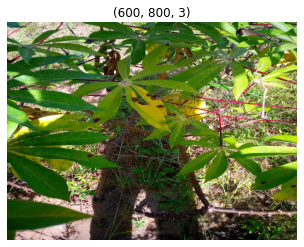

In [12]:
show_sample(df['image_id'][0])

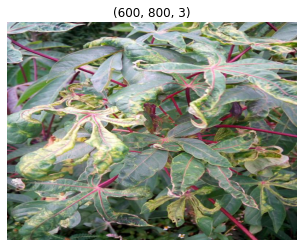

In [13]:
show_sample(df['image_id'][5])

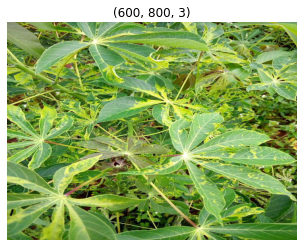

In [14]:
show_sample(df['image_id'][10])

In [15]:
X = df['image_id']
y = df['label']

# Splitting Data

In [16]:
from sklearn.model_selection import train_test_split
seed=3
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=seed)
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, stratify=y_train, random_state=seed)

In [17]:
y_train.value_counts(normalize=True)

Cassava Mosaic Disease (CMD)           0.614913
Healthy                                0.120426
Cassava Green Mottle (CGM)             0.111517
Cassava Brown Streak Disease (CBSD)    0.102315
Cassava Bacterial Blight (CBB)         0.050829
Name: label, dtype: float64

In [18]:
y_valid.value_counts(normalize=True)

Cassava Mosaic Disease (CMD)           0.615070
Healthy                                0.120327
Cassava Green Mottle (CGM)             0.111565
Cassava Brown Streak Disease (CBSD)    0.102220
Cassava Bacterial Blight (CBB)         0.050818
Name: label, dtype: float64

In [19]:
y_test.value_counts(normalize=True)

Cassava Mosaic Disease (CMD)           0.614953
Healthy                                0.120561
Cassava Green Mottle (CGM)             0.111449
Cassava Brown Streak Disease (CBSD)    0.102336
Cassava Bacterial Blight (CBB)         0.050701
Name: label, dtype: float64

# Getting Data Ready for Model using efficient tf.dataset pipeline

In [20]:
AUTOTUNE = tf.data.experimental.AUTOTUNE

In [21]:
def get_dls(X, y, type_tfms, after_item, bs, training=True):
    X = np.array(X)
    y = np.array(y)
    dls = tf.data.Dataset.from_tensor_slices((X,y)) #initiate dataloader of tensorflow
#     dls = dls.cache('/kaggle/working/dump')
    if training : 
        dls = dls.shuffle(len(y))
        
    dls = dls.map(type_tfms, num_parallel_calls=AUTOTUNE)
    dls = dls.map(after_item, num_parallel_calls=AUTOTUNE)
    dls = dls.batch(bs)
    dls = dls.prefetch(buffer_size=AUTOTUNE)
    return dls


In [22]:
class type_tfms(tf.keras.layers.Layer):  #coverts path,str_labels to image, ohe_label
    def __init__(self, vocab):
        super(type_tfms, self).__init__()
        self.vocab = vocab
        
    def call(self, img_path, str_label):
        image_file = tf.io.read_file(img_path) #read file
        image = tf.image.decode_jpeg(image_file, channels=3) #get tensor image in pixel range [0,255] 

        label = (str_label==self.vocab)      #ohe str_label
        label = tf.cast(label, tf.float64)
        return image, label

class item_tfms(tf.keras.layers.Layer): #for resizing
    def __init__(self, size):
        super(item_tfms, self).__init__()
        self.size = size
    
    def call(self,image, label):
        image = tf.image.resize(image, self.size) #resizes images, pixel values in [0,255] floats
        return image,label   


In [23]:
bs=64 #batch size
size=[300,400] #input image size for model
vocab = list(y.unique()) #vocabulary to access string labels
train_dls = get_dls(X_train, y_train, type_tfms(vocab), item_tfms(size), bs, training=True) #train dataloader
valid_dls = get_dls(X_valid, y_valid, type_tfms(vocab), item_tfms(size), bs, training=False) #valid dataloader
test_dls = get_dls(X_test, y_test, type_tfms(vocab), item_tfms(size), bs, training=False) #test dataloader
print(f'Number of training batches: {len(train_dls)}')
print(f'Number of validation batches: {len(valid_dls)}')
print(f'Number of testing batches: {len(test_dls)}')

Number of training batches: 214
Number of validation batches: 54
Number of testing batches: 67


In [24]:
def get_one_batch(dls):
    image_batch, label_batch = next(iter(dls.take(1).as_numpy_iterator()))
    return image_batch, label_batch
        
def show_batch(dls, grid=3, figsize=(15,15)): #to check whether dataloader is initialized properly
    plt.figure(figsize=figsize)
    image_batch, label_batch = get_one_batch(dls)
    for i in range(grid*grid):
        plt.subplot(grid,grid, i+1)
        plt.imshow(image_batch[i].astype('uint8'))
        plt.title(vocab[np.argmax(label_batch[i])])
        plt.axis('off')

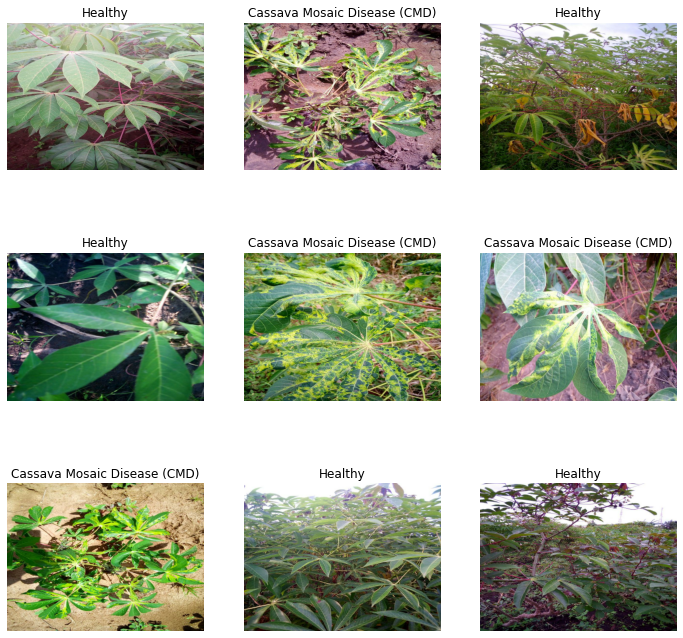

In [25]:
show_batch(train_dls, grid=3, figsize=(12,12))

# Creating Model

### I will use transfer learning 
- A pre-trained model is used that was previously trained on a large dataset, typically on a large-scale image-classification task. You either use the pretrained model as is or use transfer learning to customize this model to a given task.

- The intuition behind transfer learning for image classification is that if a model is trained on a large and general enough dataset, this model will effectively serve as a generic model of the visual world. We can then take advantage of these learned feature maps without having to start from scratch.

#### To get best results:
- We just remove few last layers from pre-trained model and add our own layers, so that it can adapt to our task
- Then we freeze the pre-trained model and train only our custom 'head'
- Then we unfreeze and jointly train both the head and body (pre-trained model)


In [26]:
tf.keras.backend.clear_session()

In [27]:
aug_tfms = tf.keras.Sequential(
    [
    tf.keras.layers.experimental.preprocessing.RandomFlip("horizontal"),
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.1),
    tf.keras.layers.experimental.preprocessing.RandomZoom((-0.1,0.1))
    ],
    name='Augmentations') #augmentation layer, turns off automatically during inference

In [28]:
base_model = tf.keras.applications.ResNet50(include_top=False, 
                                            weights='imagenet',
                                            input_shape=[None,None,3]
                                                 ) # pretrained model for transfer learning

base_model.trainable=False #freezing the base model 

for i in base_model.layers: #changing batchnorm parameters for finetuning (advisable from experiments)
    if isinstance(i, tf.keras.layers.BatchNormalization):
        i.trainable = True
        i.momentum = 0.9
        i.epsilon = 1e-5


94773248/94765736 [==============================] - 1s 0us/step


In [29]:
def get_model(base_model, batch_tfms, n_out):
    inputs = tf.keras.layers.Input(shape=(None,None,3))
    x = batch_tfms(inputs)
    x = tf.keras.applications.resnet50.preprocess_input(x) #expects image in [0,255] floats
    x = base_model(x, training=False)
    out1 = tf.keras.layers.GlobalMaxPooling2D()(x) #custom head starts from here
    out2 = tf.keras.layers.GlobalAveragePooling2D()(x)
    concat = tf.keras.layers.Concatenate()([out1, out2])
    x = tf.keras.layers.Flatten()(concat)
    x = tf.keras.layers.BatchNormalization(momentum=0.9, epsilon=1e-5)(x)
    x = tf.keras.layers.Dropout(0.25)(x)
    x = tf.keras.layers.Dense(512, activation='relu', use_bias=False)(x)  
    x = tf.keras.layers.BatchNormalization(momentum=0.9, epsilon=1e-5)(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    outputs = tf.keras.layers.Dense(n_out, use_bias=False)(x)

    model = tf.keras.Model(inputs = inputs, outputs = outputs)
    
    return model


In [30]:
model = get_model(base_model, batch_tfms=aug_tfms, n_out=len(vocab))
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
Augmentations (Sequential)      (None, None, None, 3 0           input_2[0][0]                    
__________________________________________________________________________________________________
tf.__operators__.getitem (Slici (None, None, None, 3 0           Augmentations[0][0]              
__________________________________________________________________________________________________
tf.nn.bias_add (TFOpLambda)     (None, None, None, 3 0           tf.__operators__.getitem[0][0]   
______________________________________________________________________________________________

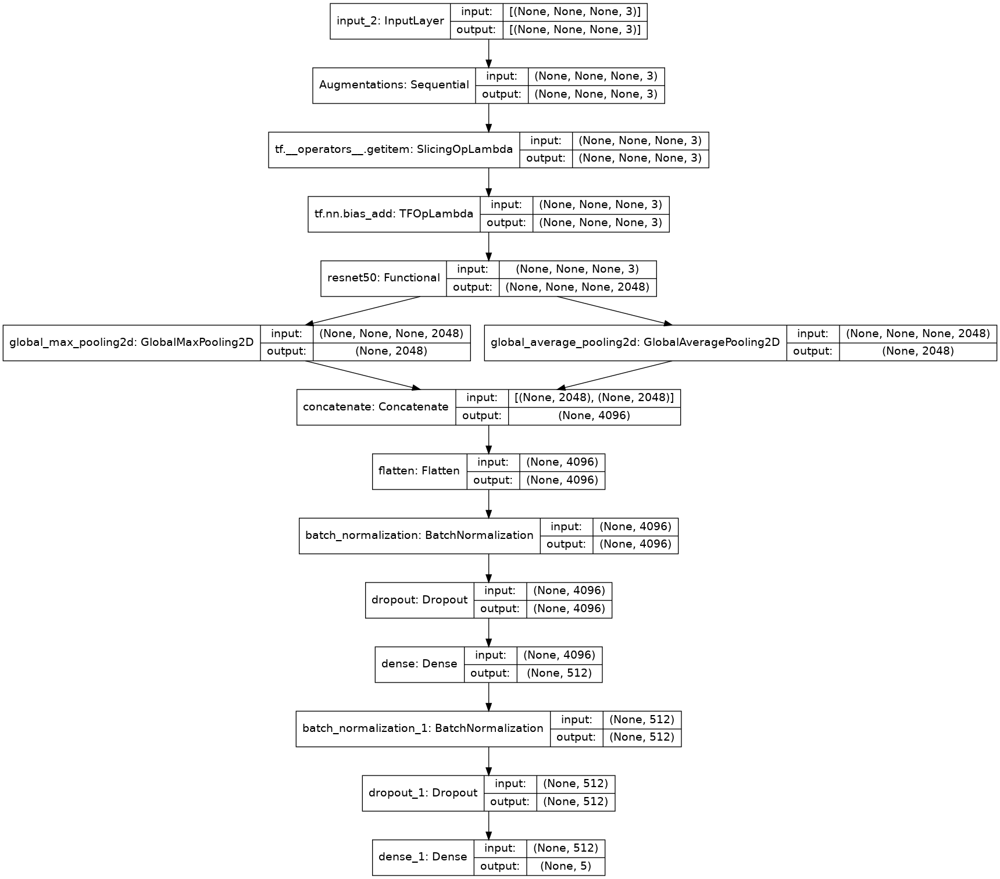

In [31]:
tf.keras.utils.plot_model(model, show_shapes=True)

In [32]:
import tensorflow_addons as tfa

loss = tf.keras.losses.CategoricalCrossentropy(from_logits=True, label_smoothing=0.1) 
metrics = ['accuracy', tfa.metrics.F1Score(num_classes=len(vocab))] 

model.compile(optimizer=tf.keras.optimizers.Adam(beta_2=0.99, epsilon=1e-5),
              loss=loss,
              metrics=metrics)

# Training

In [33]:
class scheduler(): 
    def __init__(self, start, end, n_iter, sch_func=None): #n_iters to do scheduling from start to end using sch_func
        self.start,self.end = start, end
        self.n_iter = n_iter
        self.sch_func = sch_func
        self.n = 0        

    def step(self):
        self.n += 1
        return self.sch_func(self.start, self.end, self.n/self.n_iter)
    
    def over(self):
        return self.n>=self.n_iter

### I will implement learning rate finder using callback, this will help decide best learning rate
- The idea is to start with small learning rate (like 1e-4, 1e-3) and increase the learning rate after each mini-batch till loss starts exploding. Once loss starts exploding stop the range test run. Plot the learning rate vs loss plot. Choose the learning rate one order lower than the learning rate where loss is minimum( if loss is low at 0.1, good value to start is 0.01). This is the value where loss is still decreasing. Paper suggests this to be good learning rate value for model.
ResearchPaper Reference: https://arxiv.org/pdf/1506.01186.pdf

In [34]:
class LrFinder(tf.keras.callbacks.Callback): #callback to find best learning rate
    def __init__(self, start_lr, end_lr, num_it):
        super(LrFinder, self).__init__()
        self.start_lr = start_lr
        self.end_lr = end_lr
        self.num_it = num_it
        self.beta = 0.95
        self.lrs = []
        self.losses = []
        
    def exp_sch(self, start, end, pct): #returns the lr based on pct iterations/batches completed
        return start * (end/start) ** pct
        
    def on_train_begin(self, logs=None):
        self.avgLoss = 0
        self.bestLoss = 0
        tf.keras.backend.set_value(self.model.optimizer.learning_rate, self.start_lr)
        
        
    def on_train_batch_end(self, batch, logs=None):  
        
        lr = tf.keras.backend.get_value(self.model.optimizer.learning_rate) 
        self.lrs.append(lr)

        
        l = logs['loss'] #gives current loss value
        curr_it = batch+1
        #Compute the smoothed loss
        self.avgLoss = (self.beta * self.avgLoss) + ((1 - self.beta) * l) #current running avg
        smoothed_loss = self.avgLoss / (1 - (self.beta ** curr_it))
        self.losses.append(smoothed_loss)
        
        stopLoss = 4 * self.bestLoss #loss at which to stop
        
        #Stop if the loss is exploding
        if curr_it>1 and smoothed_loss > stopLoss:
            self.model.stop_training = True 
            return
            

        if curr_it == 1 or smoothed_loss < self.bestLoss:
            self.bestLoss = smoothed_loss
            
        pct = curr_it/self.num_it
        new_lr = self.exp_sch(self.start_lr, self.end_lr, pct) #get lr based on pct
        tf.keras.backend.set_value(self.model.optimizer.learning_rate, new_lr) #set new lr
        

In [35]:

def lr_find(model, dls, start_lr=1e-07, end_lr=10, num_it=100, s=5, e=5): #function to find best learning rate
    lr_finder_cb = LrFinder(start_lr=start_lr, end_lr=end_lr, num_it=num_it)
    
    tf.keras.models.save_model(model, 'tmp.h5')
    
    model.fit(dls, 
              epochs=1, 
              callbacks=[lr_finder_cb],
              steps_per_epoch=num_it)
    
    model = tf.keras.models.load_model('tmp.h5')
    
    
    lrs = lr_finder_cb.lrs[s:-e]
    losses = lr_finder_cb.losses[s:-e]

    
    fig = make_subplots(1,2, subplot_titles=['Loss Summary', 'Learning Rate Summary'])
    fig.add_trace(go.Scatter(x= lrs,
                             y= losses, name='LossVsLr'),1,1)
    
    fig.add_trace(go.Scatter(x= np.arange(1,len(lrs)+1)[s:-e],
                             y= lrs, name='LrVsIter'),1,2)
    
    fig.update_xaxes(title='Learning Rate', row=1, col=1, type="log", showexponent = 'all', exponentformat = 'power')
    fig.update_yaxes(title='Smoothed Loss',row=1,col=1)
    
    fig.update_xaxes(title='Iterations',row=1, col=2)
    fig.update_yaxes(title='Learning Rate',row=1,col=2)
    fig.update_layout(title='Learning Rate Finder', showlegend=False)
    fig.update_layout(hovermode="x")
    fig.show()
    return model

In [36]:
model = lr_find(model, train_dls)

100/100 [==============================] - 44s 374ms/step - loss: 5.9672 - accuracy: 0.2734 - f1_score: 0.2095


### Now I will implement OneCycle Policy using callback
- Research Paper reference : https://arxiv.org/abs/1803.09820
- Idea here is to cycle the learning rate and momentum during training between a upper bound and lower bound
- Motivation for using Cyclical learning rate: Well, experiments have shown, cyclically varying the learning rate between reasonable bounds can actually increase the accuracy of the model in fewer steps. And the reason behind is:
- higher learning rates help in coming out of local minima and the lower learning rates prevents the training from diverging.

- Author reccomends to use one cycle of 2 steps of equal length, where the maximum learning rate is chosen from LR range test (found previously) and the minimum learning rate is 1/5th or 1/10th of maximum.
- We pick the cycle length slightly lesser than the total number of epochs to be trained.
- And in the last remaining iterations, we annihilate learning rate way below lower learning rate value(1/10 th or 1/100 th) [credits](https://towardsdatascience.com/finding-good-learning-rate-and-the-one-cycle-policy-7159fe1db5d6). 

- Author found in their experiments that reducing the momentum when learning rate is increasing gives better results.
- I will implement a different variant of this (based on experments from [fastai](https://www.fast.ai/)) but overall idea is this only
( Plots will make it clear what is happening )

In [37]:
class oneCyclePolicy(tf.keras.callbacks.Callback): #callback to implement one cyclic learning rate schedule with annealing
    def __init__(self, lrs, moms, iters, schs):
        super(oneCyclePolicy, self).__init__()
        self.start_lr = lrs[0]
        self.start_mom = moms[0]
        self.sch_lr1 = scheduler(lrs[0], lrs[1], iters[0], schs[0])
        self.sch_lr2 = scheduler(lrs[1], lrs[2], iters[1], schs[1])
        self.sch_mom1 = scheduler(moms[0], moms[1], iters[0], schs[0])
        self.sch_mom2 = scheduler(moms[1], moms[2], iters[1], schs[1])
        self.lrs=[]
        self.moms=[]
        self.losses=[]
        
    def on_train_begin(self, logs=None):
        tf.keras.backend.set_value(self.model.optimizer.learning_rate, self.start_lr)
        tf.keras.backend.set_value(self.model.optimizer.beta_1, self.start_mom)
        
    def on_train_batch_end(self, batch, logs=None):  
        lr = tf.keras.backend.get_value(self.model.optimizer.learning_rate) 
        self.lrs.append(lr)
        mom = tf.keras.backend.get_value(self.model.optimizer.beta_1) 
        self.moms.append(mom)
        l=logs['loss']
        self.losses.append(l)
        
        
        if self.sch_lr1.over():
            new_lr = self.sch_lr2.step()
            new_mom = self.sch_mom2.step()
        else:
            new_lr = self.sch_lr1.step()
            new_mom = self.sch_mom1.step()                 

        tf.keras.backend.set_value(self.model.optimizer.learning_rate, new_lr)
        tf.keras.backend.set_value(self.model.optimizer.beta_1, new_mom)

In [38]:
def cos_sch(start, end, pct): #cosine annealing
    cos_out = np.cos(np.pi * pct) + 1
    return end + (start-end)/2 * cos_out

In [39]:
def fit_one_cycle(m, t_dls, v_dls, max_lr, epochs, cbs=[], plot=True, moms=(0.95,0.85,0.95), pct=0.25, schs=[cos_sch,cos_sch], div=25, div_final=1e5): #function for training
    
    lrs = [max_lr/div, max_lr, max_lr/div_final]
    total_iters = epochs*len(t_dls)
    iters_1 = int(pct*total_iters)
    iters_2 = total_iters-iters_1
    iters=[iters_1,iters_2]
    
    oneCycle_cb = oneCyclePolicy(lrs, moms, iters, schs)
    cbs.append(oneCycle_cb)
    
    history = m.fit(t_dls, 
                    validation_data=v_dls,
                    epochs=epochs, 
                    callbacks=cbs)
    
    if plot:

        losses = oneCycle_cb.losses
        lrs = oneCycle_cb.lrs
        moms = oneCycle_cb.moms

        fig = go.Figure()
        fig.add_trace(go.Scatter(x= np.arange(1, total_iters+1),
                                 y= losses, name='Train_Loss'))
        fig.add_trace(go.Scatter(x= np.arange(1,epochs+1)*len(t_dls),
                                 y= history.history['val_loss'], name='Val_Loss'))
        fig.update_xaxes(title='Iterations')
        fig.update_yaxes(title='Loss')
        fig.update_layout(title='Loss Summary')
        fig.show()

        fig = make_subplots(1,2, subplot_titles=['Learning Rate', 'Momentum'])
        fig.add_trace(go.Scatter(x= np.arange(1, total_iters+1),
                                 y= lrs, name='Learning Rate'),1,1)
        fig.add_trace(go.Scatter(x= np.arange(1, total_iters+1),
                                 y= moms, name='Momentum'),1,2)
        fig.update_xaxes(title='Iterations')
        fig.update_yaxes(title='Learning Rate',row=1,col=1)
        fig.update_yaxes(title='Momentum',row=1,col=2)
        fig.update_layout(title='Training Summary', showlegend=False)
        fig.show()
    

In [40]:
epochs = 2
max_lr = 1e-2
fit_one_cycle(model, train_dls, valid_dls, max_lr=max_lr, epochs=epochs)

Epoch 1/2
214/214 [==============================] - 177s 800ms/step - loss: 1.3090 - accuracy: 0.6612 - f1_score: 0.4686 - val_loss: 1.0690 - val_accuracy: 0.6790 - val_f1_score: 0.5714
Epoch 2/2
214/214 [==============================] - 158s 737ms/step - loss: 0.8195 - accuracy: 0.8047 - f1_score: 0.6531 - val_loss: 0.7580 - val_accuracy: 0.8312 - val_f1_score: 0.6956


In [41]:
tf.keras.models.save_model(model, 'stage1.h5')

In [42]:
model = tf.keras.models.load_model('stage1.h5')

In [43]:
model.trainable=True #unfreeze the whole model for finetuning

        
model.compile(optimizer=tf.keras.optimizers.Adam(beta_2=0.99, epsilon=1e-5),
              loss=loss,
              metrics=metrics)

In [44]:
model = lr_find(model, train_dls)

100/100 [==============================] - 86s 794ms/step - loss: 2.7732 - accuracy: 0.7731 - f1_score: 0.3445


In [45]:
max_lr = 2e-5
epochs = 10
cbs = [tf.keras.callbacks.ModelCheckpoint('best.h5', monitor='val_loss', verbose=1, 
                                          save_best_only=True, save_weights_only=True)]
fit_one_cycle(model, train_dls, valid_dls, max_lr=max_lr, epochs=epochs, cbs=cbs)

Epoch 1/10
214/214 [==============================] - 206s 935ms/step - loss: 0.7510 - accuracy: 0.8333 - f1_score: 0.6991 - val_loss: 0.7433 - val_accuracy: 0.8362 - val_f1_score: 0.7064

Epoch 00001: val_loss improved from inf to 0.74332, saving model to best.h5
Epoch 2/10
214/214 [==============================] - 199s 928ms/step - loss: 0.7418 - accuracy: 0.8380 - f1_score: 0.7084 - val_loss: 0.7355 - val_accuracy: 0.8435 - val_f1_score: 0.7137

Epoch 00002: val_loss improved from 0.74332 to 0.73547, saving model to best.h5
Epoch 3/10
214/214 [==============================] - 198s 923ms/step - loss: 0.7278 - accuracy: 0.8436 - f1_score: 0.7223 - val_loss: 0.7478 - val_accuracy: 0.8367 - val_f1_score: 0.7086

Epoch 00003: val_loss did not improve from 0.73547
Epoch 4/10
214/214 [==============================] - 199s 926ms/step - loss: 0.7061 - accuracy: 0.8567 - f1_score: 0.7429 - val_loss: 0.7393 - val_accuracy: 0.8455 - val_f1_score: 0.7366

Epoch 00004: val_loss did not improve

#### In few epochs of training, we are getting so good results, mostly because:
  - Transfer Learning
  - Learning rate finder
  - OneCycle Policy

In [46]:
model.load_weights('best.h5')
model.evaluate(valid_dls)

54/54 [==============================] - 13s 235ms/step - loss: 0.6897 - accuracy: 0.8703 - f1_score: 0.7638


[0.6897353529930115,
 0.8703271150588989,
 array([0.59006214, 0.9541805 , 0.7757009 , 0.77792734, 0.7210585 ],
       dtype=float32)]

# Checking Performance on Validation data

In [47]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

In [48]:
def get_inference_df(X_paths, dls, model, loss_fn, vocab=None): # function to get loss and pred for each input image in a dataloader
     
    y_true_ohe = tf.concat([y for x,y in dls],0)
    true_labels = tf.argmax(y_true_ohe,1).numpy()

    logits_ohe = model.predict(dls)
    
    losses = loss_fn(y_true_ohe, logits_ohe).numpy()
    pred_labels = tf.argmax(logits_ohe,1).numpy()
    

    summary = pd.DataFrame({'img_path':X_paths, 'loss':losses, 'pred_label':pred_labels, 'true_label':true_labels})
    summary = summary.sort_values('loss', ascending=False)
    if vocab:
        summary['pred_label'] = summary['pred_label'].apply(lambda x: vocab[x])
        summary['true_label'] = summary['true_label'].apply(lambda x: vocab[x])
    summary = summary.reset_index(drop=True)

    
    return summary 

In [49]:
loss_fn = tf.keras.losses.CategoricalCrossentropy(from_logits=True, reduction='none',label_smoothing=0.1)
val_infer_df = get_inference_df(X_valid, valid_dls, model, loss_fn, vocab)
val_infer_df.head()

,img_path,loss,pred_label,true_label
0,/kaggle/input/cassava-leaf-disease-classificat...,9.480833,Cassava Brown Streak Disease (CBSD),Cassava Mosaic Disease (CMD)
1,/kaggle/input/cassava-leaf-disease-classificat...,6.441361,Cassava Brown Streak Disease (CBSD),Cassava Green Mottle (CGM)
2,/kaggle/input/cassava-leaf-disease-classificat...,5.136333,Healthy,Cassava Green Mottle (CGM)
3,/kaggle/input/cassava-leaf-disease-classificat...,5.054600,Cassava Green Mottle (CGM),Cassava Mosaic Disease (CMD)
4,/kaggle/input/cassava-leaf-disease-classificat...,4.952564,Cassava Green Mottle (CGM),Cassava Brown Streak Disease (CBSD)


In [50]:
def show_results(infer_df, grid=3, figsize=(15,15)): #random results plotting
    plt.figure(figsize=figsize)
    idxs = np.random.choice(len(infer_df), grid*grid, replace=False)
    for i in range(grid*grid):

        img_path, loss, y_pred, y_true = infer_df.iloc[idxs[i]].values
        img = plt.imread(img_path)

        if y_pred == y_true:color='green' 
        else : color='red'

        plt.subplot(grid,grid,i+1)  
        plt.imshow(img)
        plt.title(f'y_true: {y_true} \n y_pred: {y_pred}',fontsize=12, color=color)
        plt.tight_layout()
        plt.xticks([])
        plt.yticks([])
    plt.show()

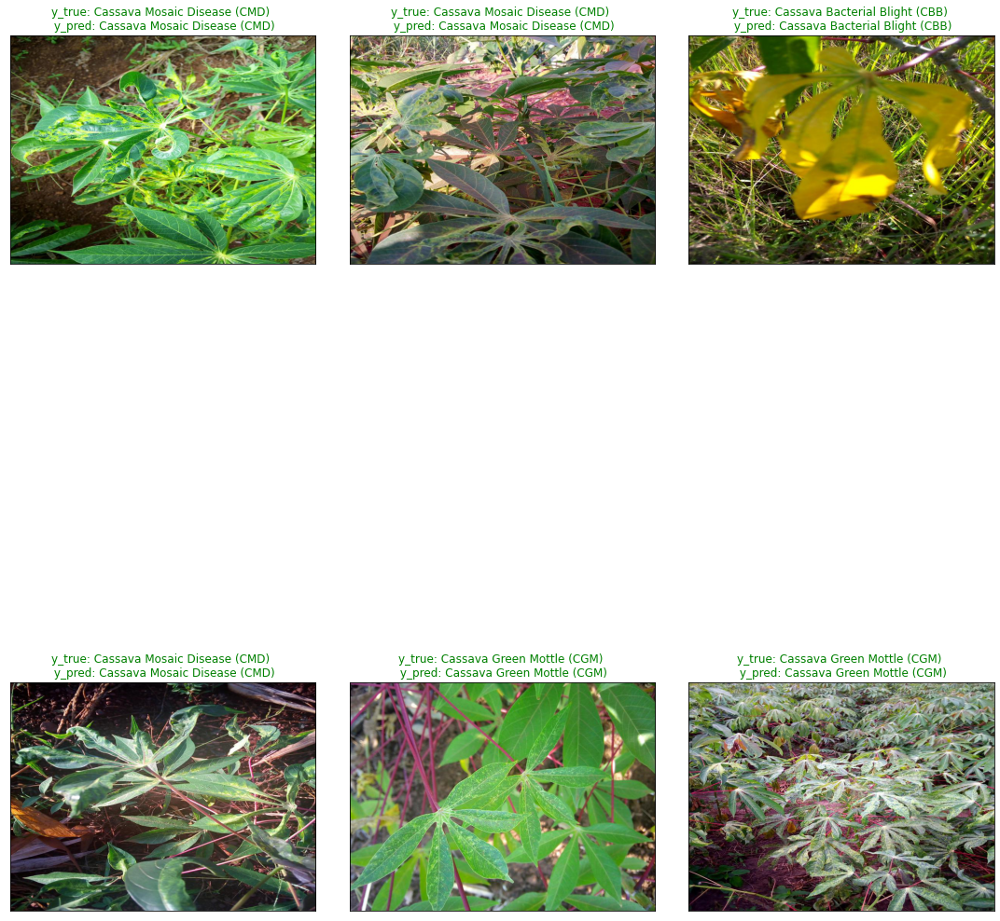

In [51]:
show_results(val_infer_df, grid=3, figsize=(15,15))

In [52]:
def plot_top_losses(infer_df, grid, figsize=(20,20)): #plots images that gave maximum loss i.e poor performance... can help to see what is going most wrong and how to improve
    plt.figure(figsize=figsize)
    for i in range(grid*grid):
        img_path, loss, y_pred, y_true = infer_df.iloc[i].values
        img = plt.imread(img_path)
        
        if y_pred == y_true:color='green' 
        else : color='red'
            
        plt.subplot(grid,grid,i+1)  
        plt.imshow(img, aspect='auto')
        plt.title(f'loss: {loss:.4f}',fontsize=12, color=color)
        plt.xlabel(f'y_true: {y_true} \n y_pred: {y_pred}',fontsize=12, color=color)
        plt.xticks([])
        plt.yticks([])
    plt.show()

## plots images that gave maximum loss i.e poor performance... can help to see what is going most wrong and how to improve

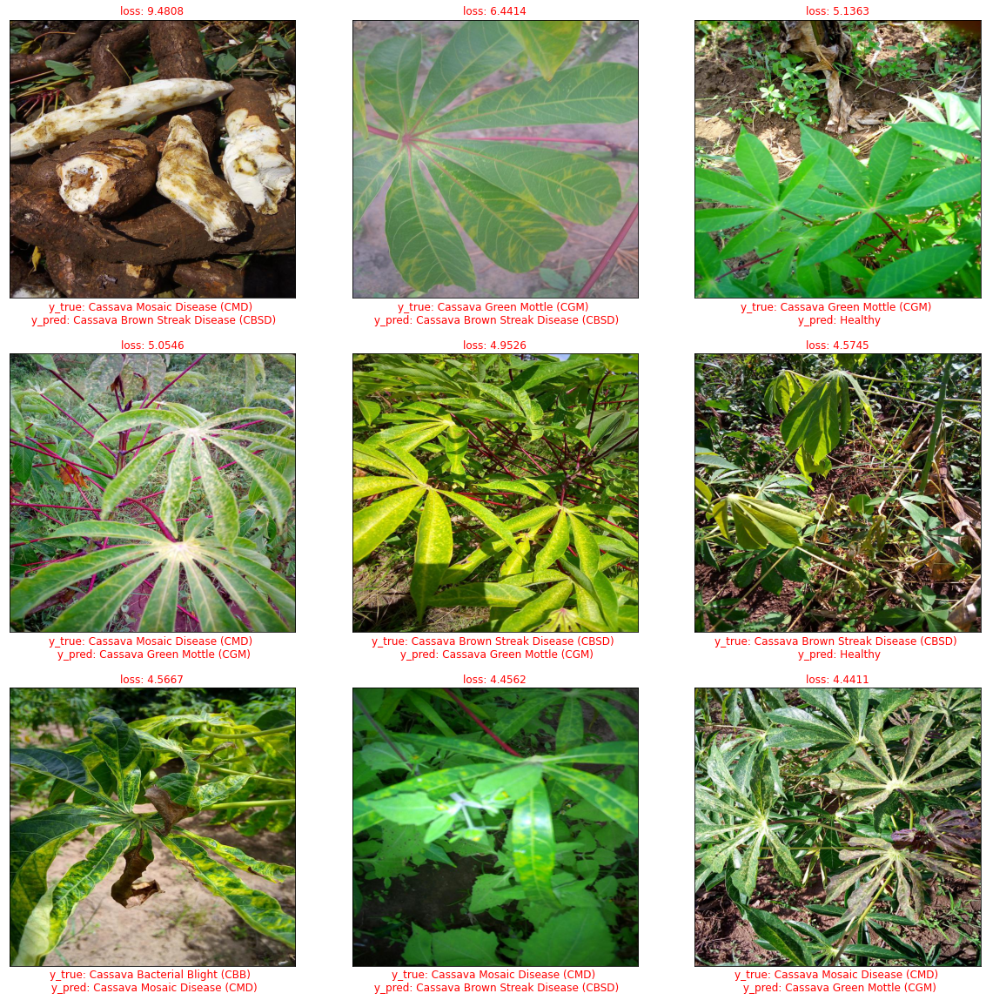

In [53]:
plot_top_losses(val_infer_df, grid=3) #on validation data

In [54]:
def show_inference_results(infer_df, vocab): # report on validation data
    print('-'*60)
    print('Mean Cross Entropy Loss: ',infer_df['loss'].mean())
    print('-'*60)
    print()
    print('-'*60)
    print('Classification Report: ')
    print('-'*60)
    print(classification_report(infer_df['true_label'],infer_df['pred_label']))
    print('-'*60)
    print()
    disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(infer_df['true_label'], infer_df['pred_label'], labels=vocab), display_labels=vocab)
    disp.plot(cmap='Blues', xticks_rotation='vertical') 
    plt.title('Confusion Matrix')
    plt.show()

------------------------------------------------------------
Mean Cross Entropy Loss:  0.6897361278533936
------------------------------------------------------------

------------------------------------------------------------
Classification Report: 
------------------------------------------------------------
                                     precision    recall  f1-score   support

     Cassava Bacterial Blight (CBB)       0.64      0.55      0.59       174
Cassava Brown Streak Disease (CBSD)       0.85      0.71      0.78       350
         Cassava Green Mottle (CGM)       0.80      0.76      0.78       382
       Cassava Mosaic Disease (CMD)       0.95      0.96      0.95      2106
                            Healthy       0.66      0.79      0.72       412

                           accuracy                           0.87      3424
                          macro avg       0.78      0.75      0.76      3424
                       weighted avg       0.87      0.87      0.87  

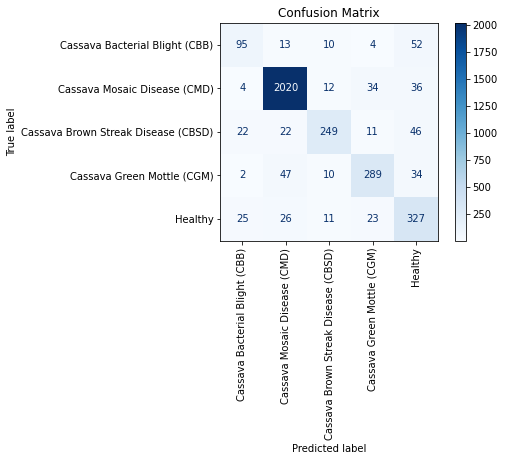

In [55]:
show_inference_results(val_infer_df, vocab)

In [56]:
# max_lr = max_lr/1000 #very low learning rate
# epochs = 1
# fit_one_cycle(m=model, t_dls=valid_dls, v_dls=None, max_lr=max_lr, epochs=epochs, plot=False) 
# #fitting one more epoch but on validation data so that all data is utilized

# Testing

In [57]:
loss_fn = tf.keras.losses.CategoricalCrossentropy(from_logits=True, reduction='none', label_smoothing=0.1)
test_infer_df = get_inference_df(X_test, test_dls, model, loss_fn, vocab)
test_infer_df.head()

,img_path,loss,pred_label,true_label
0,/kaggle/input/cassava-leaf-disease-classificat...,6.745324,Cassava Green Mottle (CGM),Cassava Mosaic Disease (CMD)
1,/kaggle/input/cassava-leaf-disease-classificat...,6.301244,Cassava Bacterial Blight (CBB),Cassava Mosaic Disease (CMD)
2,/kaggle/input/cassava-leaf-disease-classificat...,5.433402,Cassava Brown Streak Disease (CBSD),Cassava Mosaic Disease (CMD)
3,/kaggle/input/cassava-leaf-disease-classificat...,5.330717,Healthy,Cassava Green Mottle (CGM)
4,/kaggle/input/cassava-leaf-disease-classificat...,5.021548,Cassava Mosaic Disease (CMD),Cassava Green Mottle (CGM)


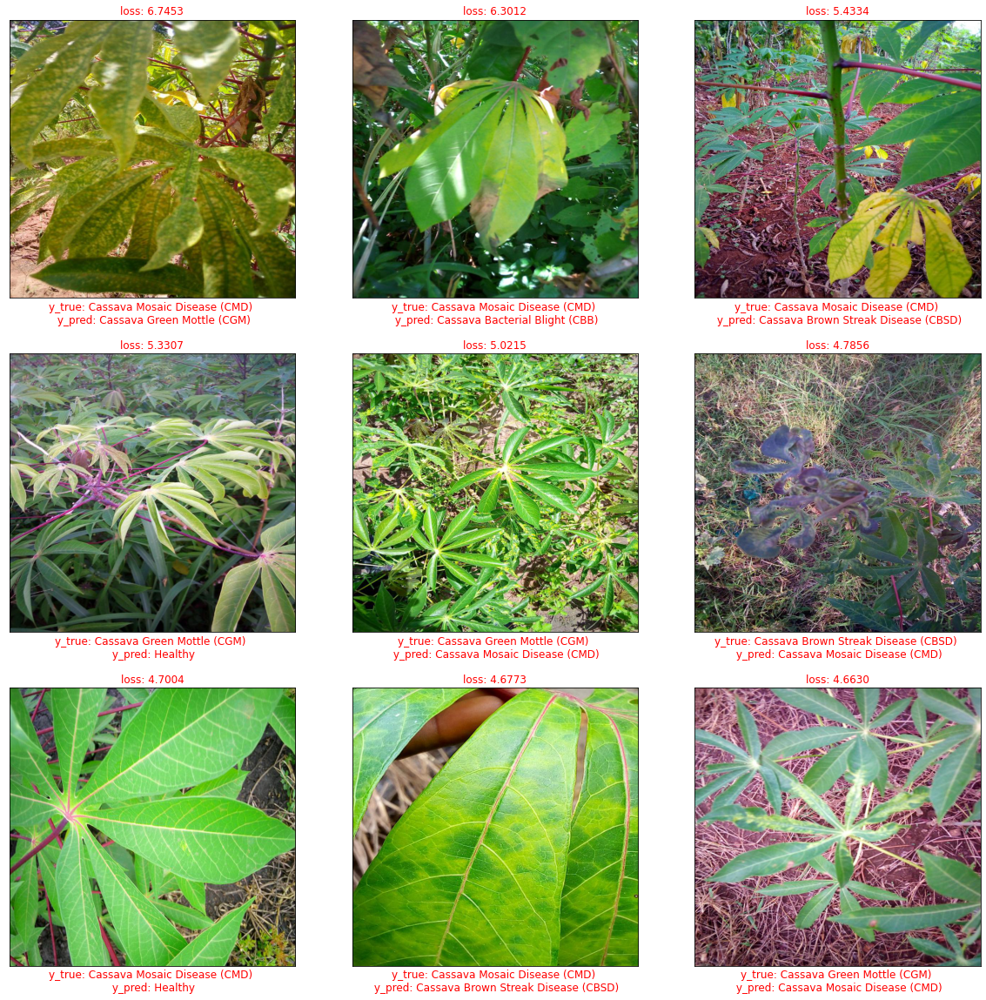

In [58]:
plot_top_losses(test_infer_df, grid=3)

------------------------------------------------------------
Mean Cross Entropy Loss:  0.6964529752731323
------------------------------------------------------------

------------------------------------------------------------
Classification Report: 
------------------------------------------------------------
                                     precision    recall  f1-score   support

     Cassava Bacterial Blight (CBB)       0.59      0.49      0.54       217
Cassava Brown Streak Disease (CBSD)       0.80      0.68      0.74       438
         Cassava Green Mottle (CGM)       0.81      0.73      0.77       477
       Cassava Mosaic Disease (CMD)       0.95      0.96      0.95      2632
                            Healthy       0.65      0.78      0.71       516

                           accuracy                           0.86      4280
                          macro avg       0.76      0.73      0.74      4280
                       weighted avg       0.86      0.86      0.86  

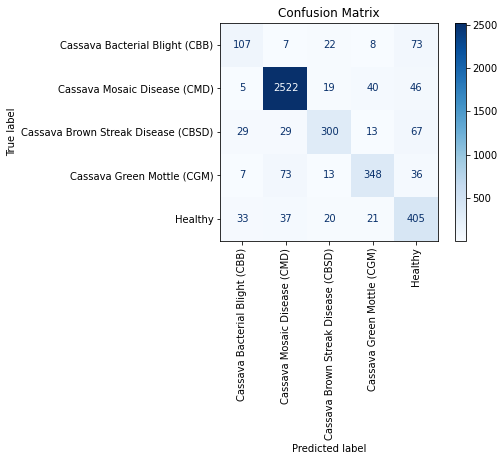

In [59]:
show_inference_results(test_infer_df, vocab)

# Prepare for Deployment

In [60]:
def get_final_model(my_model):
    inp = tf.keras.layers.Input((None,None,3))
    image = tf.image.resize(inp, size, name='Resize') 
    logits = my_model(image, training=False)
    prob = tf.nn.softmax(logits, 1, name='softmax')
    prob = tf.squeeze(prob,0) #remove batch dimension
    fin_model = tf.keras.Model(inp, prob)
    return fin_model

In [61]:
final_model = get_final_model(model) #this model will ensure minimum pre-processing and post-processing

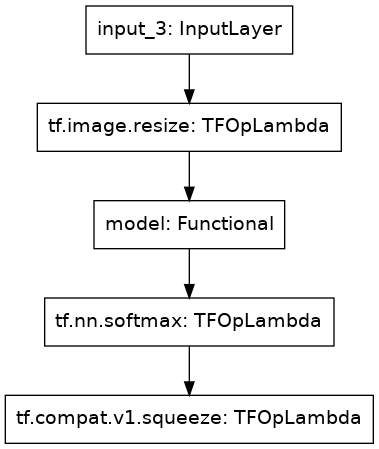

In [62]:
tf.keras.utils.plot_model(final_model)

In [63]:
tf.keras.models.save_model(final_model, 'final_model.h5')

In [64]:
def infer(path, fin_model, vocab):
    image = PIL.Image.open(path).convert('RGB') #read and resize file
    image_numpy = np.expand_dims(np.array(image), 0) #add batch dim
    # these 2 will be the only preprocessing steps required
    
    pred_probs = fin_model(image_numpy, training=False).numpy()
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    
    for i,j in zip(vocab,pred_probs):
        print(f'Probability of {i} : {j}')


Probability of Cassava Bacterial Blight (CBB) : 0.18321669101715088
Probability of Cassava Mosaic Disease (CMD) : 0.017633602023124695
Probability of Cassava Brown Streak Disease (CBSD) : 0.3006591200828552
Probability of Cassava Green Mottle (CGM) : 0.19718489050865173
Probability of Healthy : 0.3013056814670563


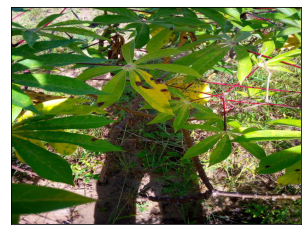

In [65]:
fin_model = tf.keras.models.load_model('final_model.h5')
infer(X[0], fin_model, vocab) #results on a sample